In [1]:
%matplotlib inline

import os

from astropy.io import fits
import astropy.units as u
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks
from scipy.signal import resample

from rascal.calibrator import Calibrator
from rascal.util import refine_peaks


C:\Users\cylam\git\rascal\src\rascal\calibrator.py:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Load the LT SPRAT data
fits_file = fits.open('data_lt_sprat/v_a_20190516_57_1_0_1.fits')[0]


C:\Users\cylam\AppData\Local\Temp\ipykernel_21816\3787890136.py:2: RuntimeWarning: invalid value encountered in log
  plt.imshow(np.log(fits_file.data), aspect='auto', origin='lower')


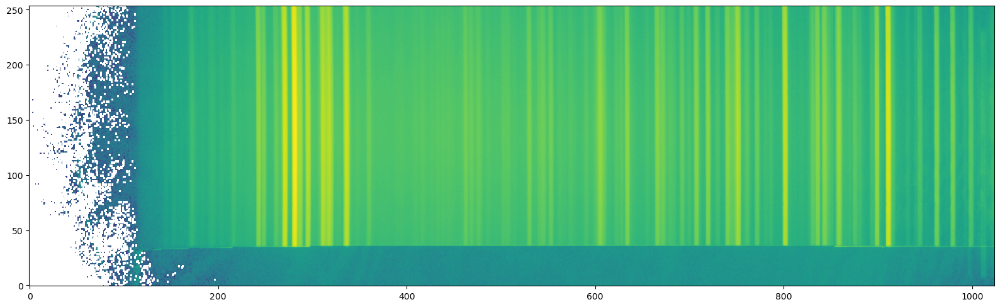

In [3]:
plt.figure(1, figsize=(16,5))
plt.imshow(np.log(fits_file.data), aspect='auto', origin='lower')
plt.tight_layout()

In [4]:
spectrum2D = fits_file.data

# Collapse into 1D spectrum between row 110 and 120
spectrum = np.median(spectrum2D[110:120], axis=0)

temperature = fits_file.header['REFTEMP']
pressure = fits_file.header['REFPRES'] * 100.
relative_humidity = fits_file.header['REFHUMID']

In [5]:
# Identify the peaks
peaks, _ = find_peaks(spectrum,
                      height=300,
                      prominence=150,
                      distance=5,
                      threshold=None)
peaks = refine_peaks(spectrum, peaks, window_width=5)

atlas = [
    4193.5, 4385.77, 4500.98, 4524.68, 4582.75, 4624.28, 4671.23, 4697.02,
    4734.15, 4807.02, 4921.48, 5028.28, 5618.88, 5823.89, 5893.29, 5934.17,
    6182.42, 6318.06, 6472.841, 6595.56, 6668.92, 6728.01, 6827.32, 6976.18,
    7119.60, 7257.9, 7393.8, 7584.68, 7642.02, 7740.31, 7802.65, 7887.40,
    7967.34, 8057.258
]
element = ['Xe'] * len(atlas)

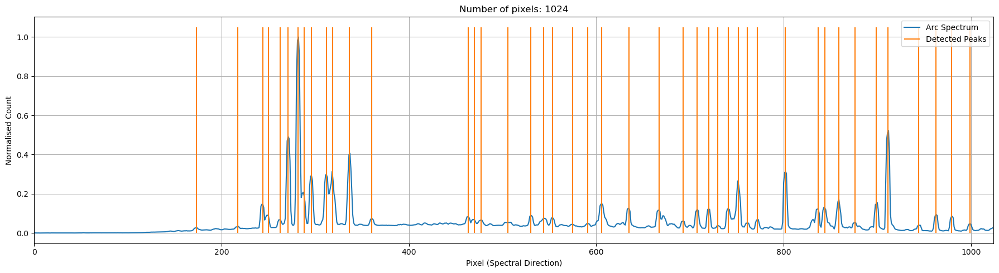

[Wed, 11 Jan 2023 13:51:00] WARNING [calibrator.py:1493] Using add_user_atlas is now deprecated. Please use the new Atlas class.


In [6]:
# Initialise the calibrator
c = Calibrator(peaks, spectrum=spectrum)
c.plot_arc()
c.set_hough_properties(num_slopes=2000,
                       range_tolerance=500.,
                       xbins=100,
                       ybins=100,
                       min_wavelength=3500.,
                       max_wavelength=8000.)
c.set_ransac_properties(sample_size=5, top_n_candidate=5, filter_close=True)
c.add_user_atlas(element,
                 atlas,
                 constrain_poly=True,
                 pressure=pressure,
                 temperature=temperature,
                 relative_humidity=relative_humidity)

c.do_hough_transform()

In [7]:
c.use_plotly()
c.plot_arc(renderer='notebook')
c.use_matplotlib()

  0%|          | 0/1000 [00:00<?, ?it/s]

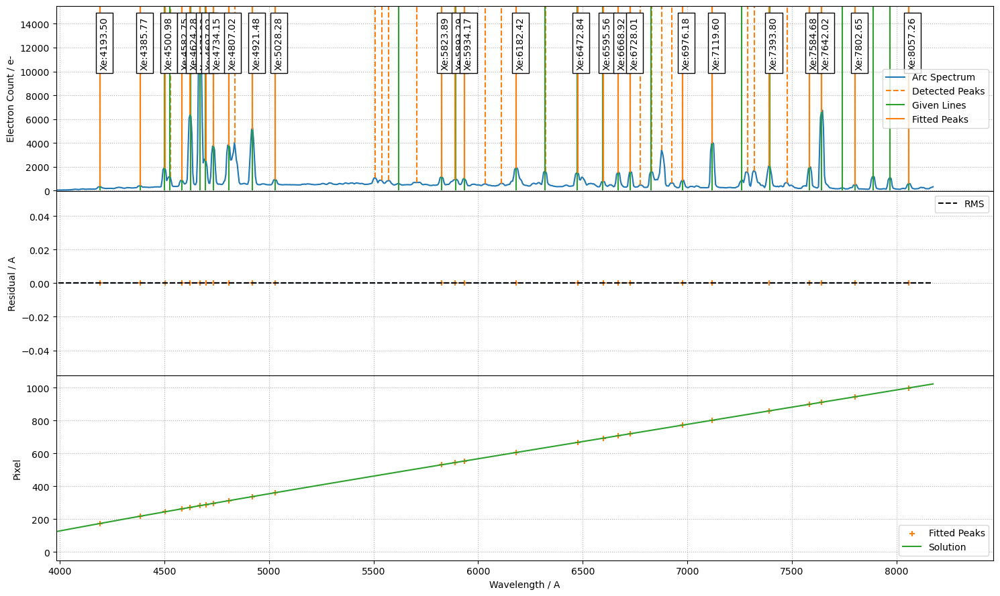

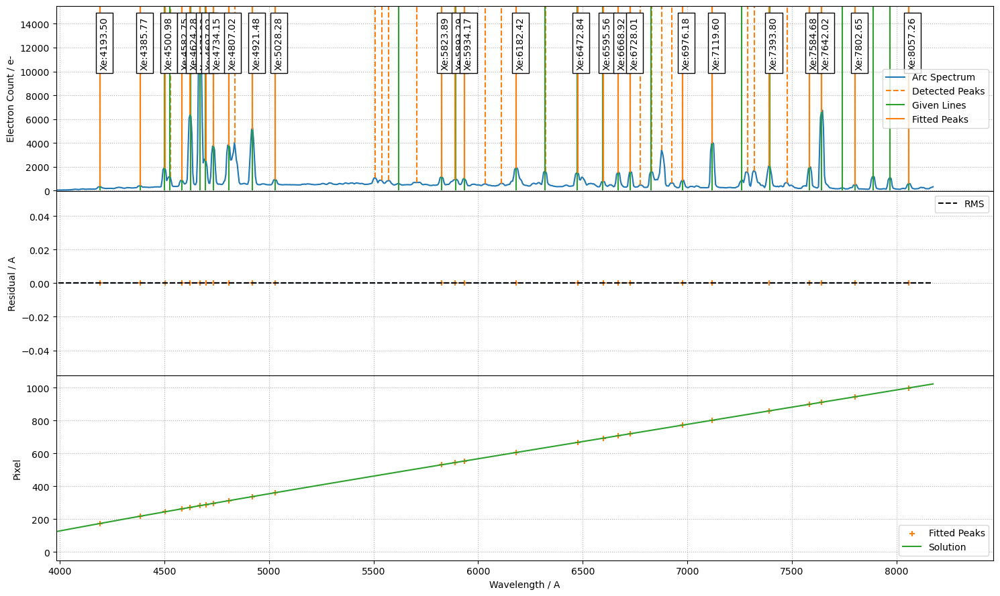

In [8]:
(fit_coeff, matched_peaks, matched_atlas, rms, residual, peak_utilisation,
 atlas_utilisation) = c.fit(max_tries=1000)

# Plot the solution
c.plot_fit(fit_coeff, spectrum, plot_atlas=True, log_spectrum=False, tolerance=5.)

In [9]:
c.use_plotly()
c.plot_fit(fit_coeff, spectrum, plot_atlas=True, log_spectrum=False, tolerance=5., renderer='notebook')
c.use_matplotlib()

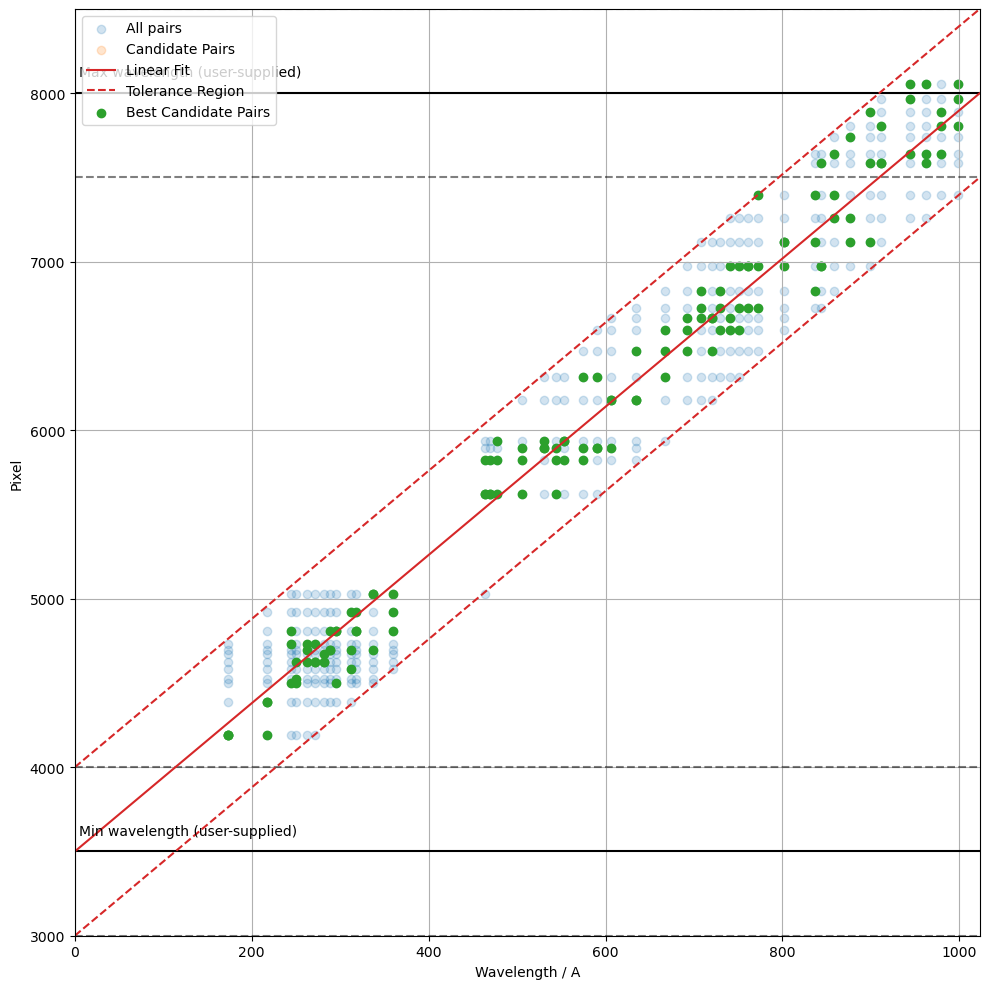

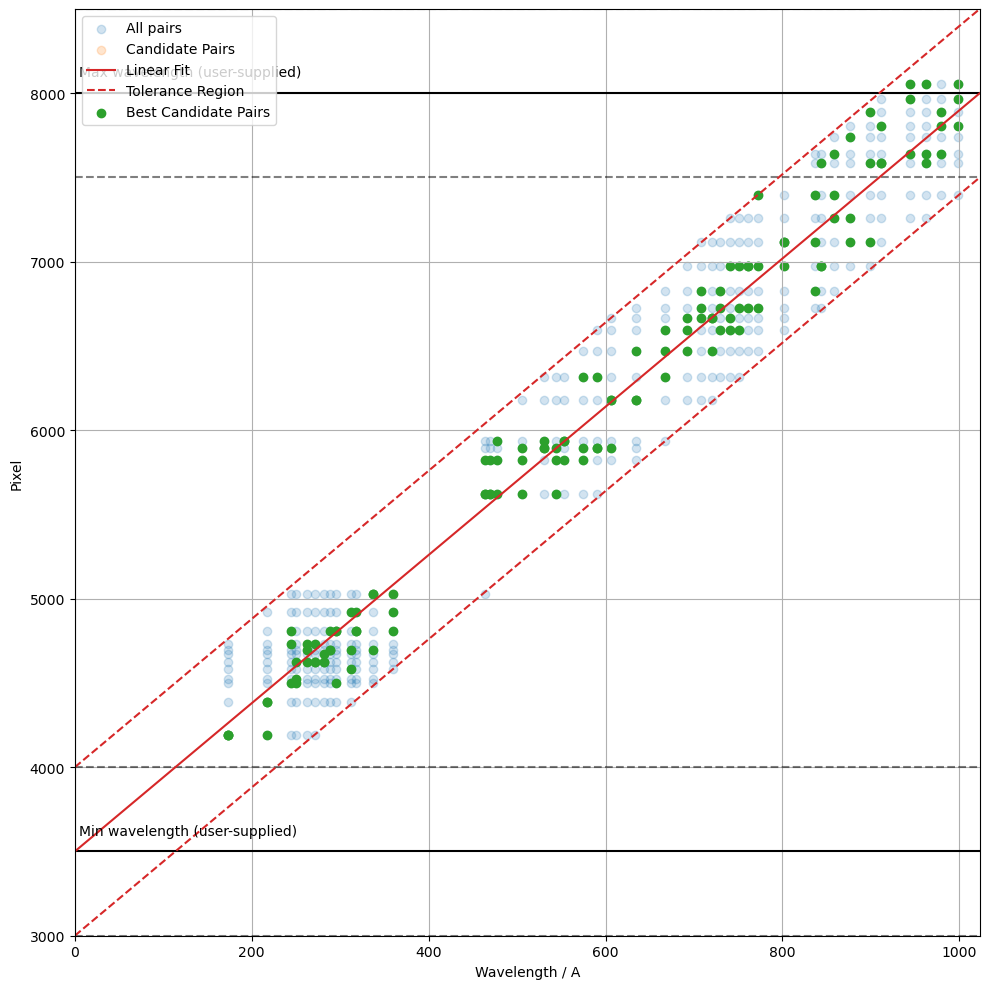

In [10]:
c.plot_search_space()

In [11]:
c.use_plotly()
c.plot_search_space(renderer='notebook')

In [12]:
print("Stdev error: {} A".format(residual.std()))
print("Peaks utilisation rate: {}%".format(peak_utilisation * 100))
print("Atlas utilisation rate: {}%".format(atlas_utilisation * 100))

Stdev error: 1.6005989872451365 A
Peaks utilisation rate: 59.09090909090909%
Atlas utilisation rate: 76.47058823529412%


# Now, we refine this set of polynomial coefficients and apply to a different night of arc

In [13]:
data2 = fits.open('data_lt_sprat/v_a_20200409_39_1_0_1.fits')[0].data
spectrum2 = np.median(data2[105:110], axis=0)

peaks2, _ = find_peaks(spectrum2, height=600, distance=5, threshold=None)
peaks_refined2 = refine_peaks(spectrum2, peaks2, window_width=5)

## Fit using the polynomial fit coefficients as the first best guess

[Wed, 11 Jan 2023 13:53:24] INFO [calibrator.py:997] num_pix is set to 1024.
[Wed, 11 Jan 2023 13:53:24] INFO [calibrator.py:1012] pixel_list is set to None.
[Wed, 11 Jan 2023 13:53:24] INFO [calibrator.py:1045] Plotting with matplotlib.
[Wed, 11 Jan 2023 13:53:24] WARNING [calibrator.py:1493] Using add_user_atlas is now deprecated. Please use the new Atlas class.


  0%|          | 0/500 [00:00<?, ?it/s]

[Wed, 11 Jan 2023 13:53:36] INFO [calibrator.py:803] Found: 10
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 4524.68 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 4524.68 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 4671.23 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 4671.23 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 4697.02 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 4697.02 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 4734.15 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 4734.15 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 4921.48 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 4921.48 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 5028.28 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:849] - matched to 5028.28 A
[Wed, 11 Jan 2023 13:53:36] INFO [plotting.py:845] Peak at: 5618.88 A
[We

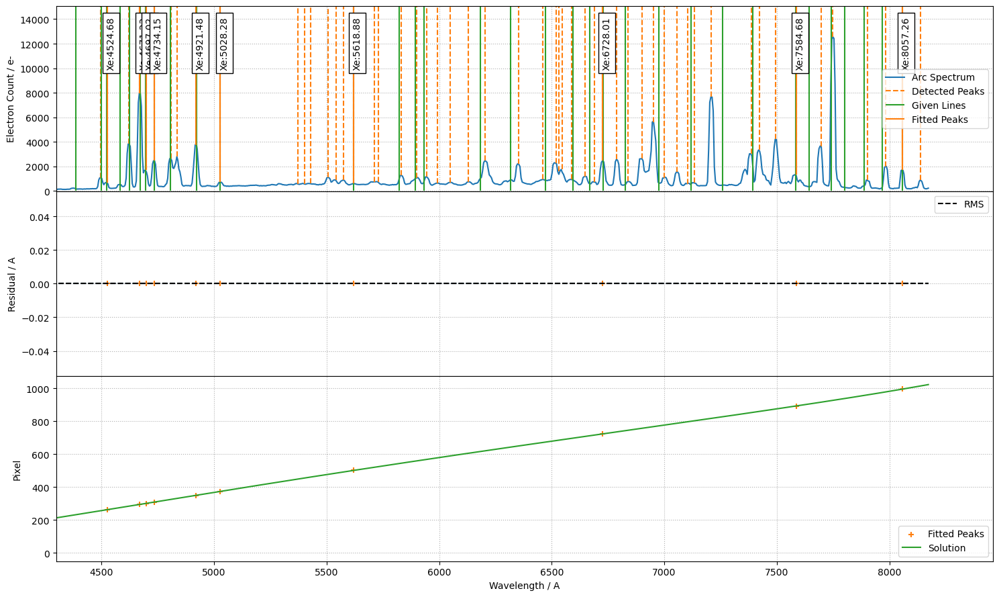

RMS: 1.0174341729058762
Stdev error: 0.5128320054545515 A
Peaks utilisation rate: 18.51851851851852%


In [14]:
c2 = Calibrator(peaks_refined2, spectrum2)
               
c2.set_calibrator_properties(num_pix=len(spectrum2),
                            plotting_library='matplotlib',
                            log_level='info') 
c2.set_hough_properties(num_slopes=5000,
                       xbins=100,
                       ybins=100,
                       min_wavelength=3500.,
                       max_wavelength=8000.,
                       range_tolerance=500.,
                       linearity_tolerance=50)
c2.add_user_atlas(elements=element,
                  wavelengths=atlas,
                  constrain_poly=True)

c2.set_ransac_properties(sample_size=5,
                        top_n_candidate=5,
                        linear=True,
                        filter_close=True,
                        ransac_tolerance=5,
                        candidate_weighted=True,
                        hough_weight=1.0)
c2.do_hough_transform()

(fit_coeff2, matched_peaks2, matched_atlas2, rms2, residual2,
 peak_utilisation2, atlas_utilisation2) = c2.fit(max_tries=500, fit_coeff=fit_coeff)

c2.plot_fit(fit_coeff2,
            plot_atlas=True,
            log_spectrum=False,
            tolerance=10.,
            renderer='notebook')

print("RMS: {}".format(rms2))
print("Stdev error: {} A".format(np.abs(residual2).std()))
print("Peaks utilisation rate: {}%".format(peak_utilisation2*100))

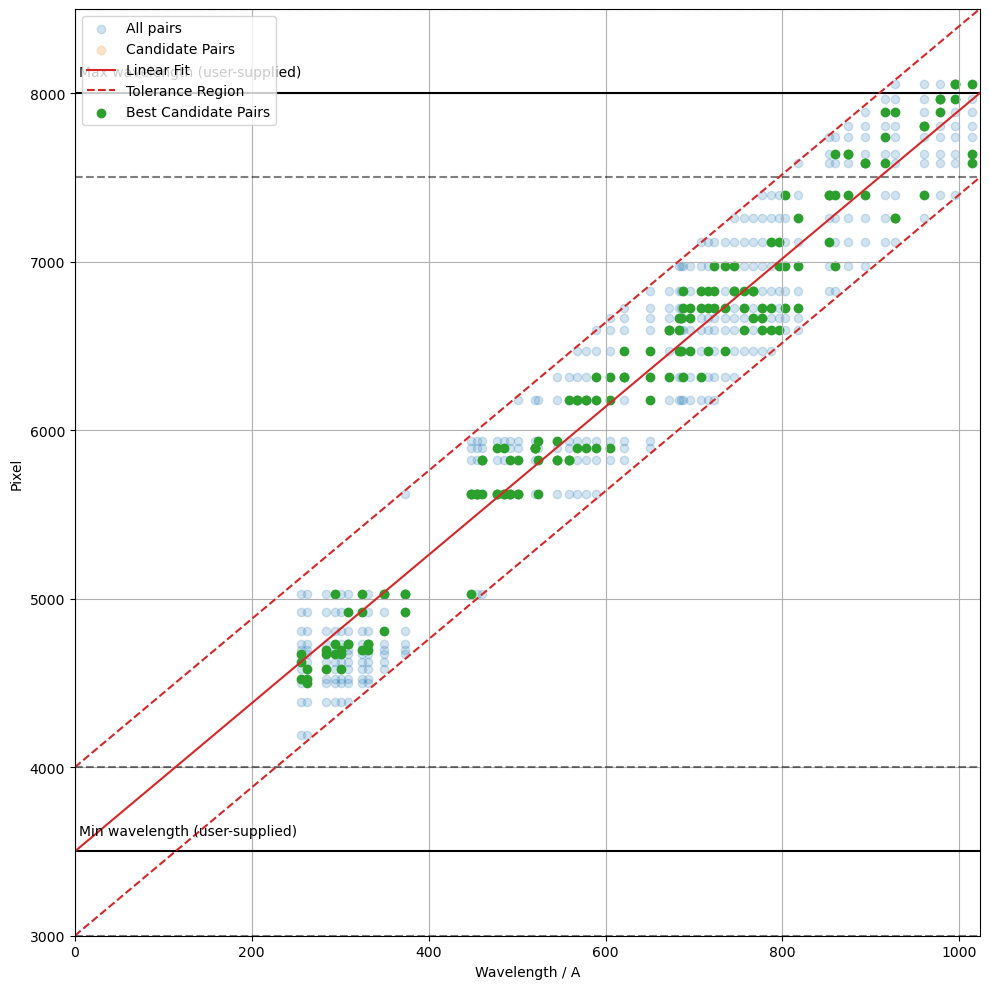

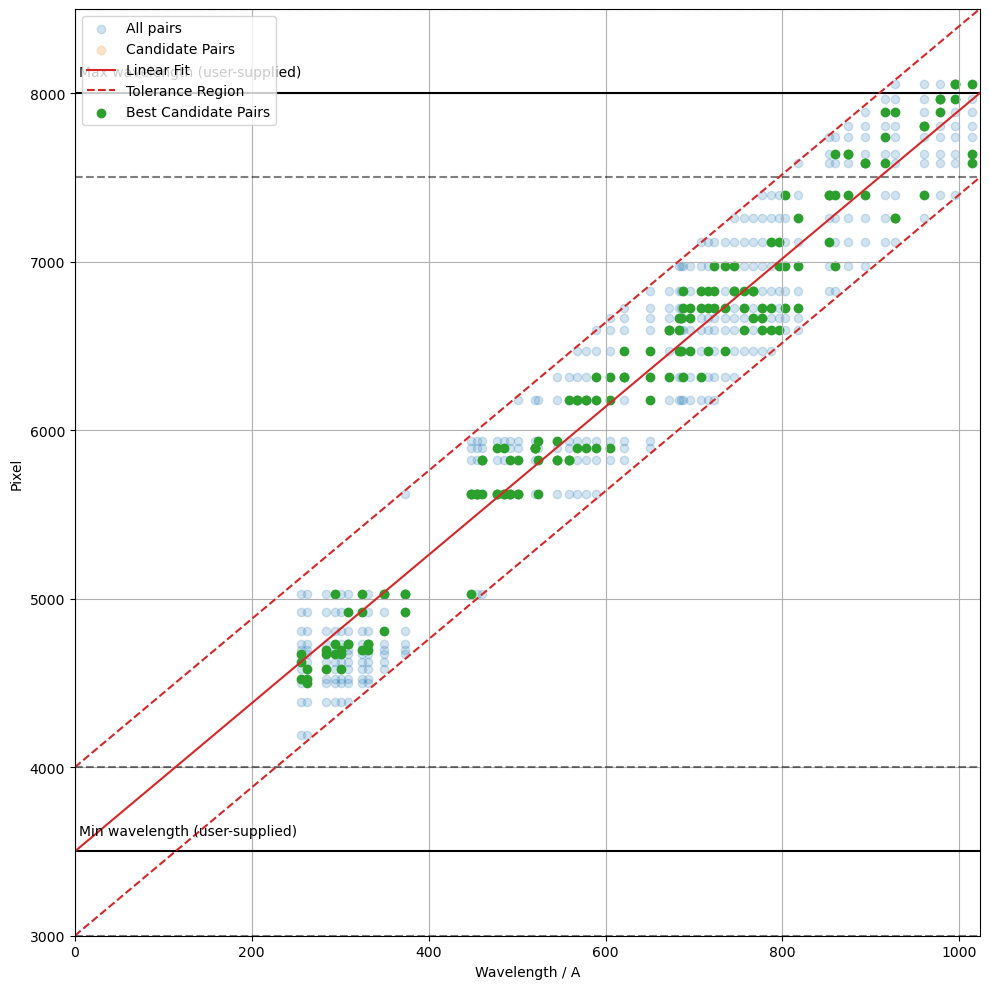

In [15]:
c2.plot_search_space()